In [1]:
import tifffile
import numpy as np

import matplotlib.pyplot as plt

In [2]:
import multiplex_imaging_pipeline.utils as utils

In [3]:
channel_to_img = utils.extract_ome_tiff(
    '/diskmnt/Projects/Users/estorrs/multiplex-imaging-pipeline/examples/test/test.ome.tiff')
channel_to_img.keys()

/diskmnt/Projects/Users/estorrs/miniconda3/envs/mip/lib/python3.8/site-packages/ome_types/_convenience.py:112: FutureWarning: The default XML parser will be changing from 'xmlschema' to 'lxml' in version 0.4.0.  To silence this warning, please provide the `parser` argument, specifying either 'lxml' (to opt into the new behavior), or'xmlschema' (to retain the old behavior).
  d = to_dict(os.fspath(xml), parser=parser, validate=validate)


dict_keys(['DAPI', 'CD31', 'E-cadherin', 'CD4', 'CD20', 'Ki67', 'CD68', 'Pan-CK', 'CD8', 'Histone H3 Pho', 'CD163', 'Podoplanin', 'CD3e', 'CD36', 'HIF1a', 'GLUT1', 'GATA3', 'CD45RO', 'CD45RA', 'SMA', 'CK19', 'MGP', 'Vimentin', 'Maspin', 'Foxp3', 'MMP9', 'HLA-DR', 'CK14', 'CD11c', 'CD44'])

In [4]:
img = channel_to_img['Pan-CK']
img.shape

(2000, 2000)

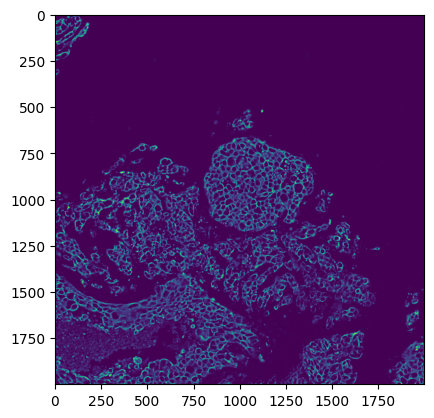

In [5]:
plt.imshow(img)

In [6]:
img_std = img / img.std()

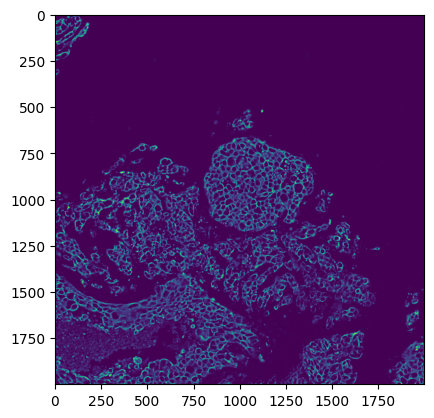

In [7]:
plt.imshow(img_std)

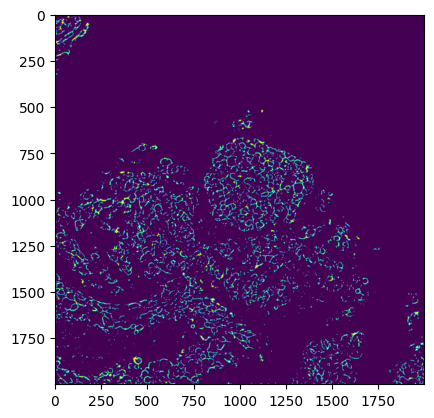

In [8]:
c = 'Pan-CK'
plt.imshow(channel_to_img[c] / channel_to_img[c].std() > 3.)

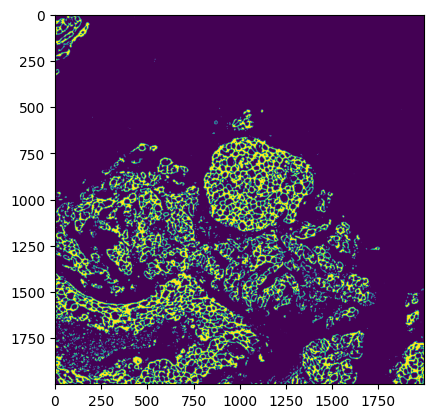

In [9]:
c = 'Pan-CK'
plt.imshow(channel_to_img[c] / channel_to_img[c].std() > 1.)

In [12]:
import seaborn as sns
import numpy as np

In [33]:
nums, counts = np.unique(vals, return_counts=True)

(array([0.        , 0.03234955, 0.0646991 , 0.09704865, 0.1293982 ,
        0.16174774, 0.19409729, 0.22644684, 0.25879639, 0.29114594,
        0.32349549, 0.35584504, 0.38819459, 0.42054414, 0.45289369,
        0.48524323, 0.51759278, 0.54994233, 0.58229188, 0.61464143,
        0.64699098, 0.67934053, 0.71169008, 0.74403963, 0.77638918,
        0.80873872, 0.84108827, 0.87343782, 0.90578737, 0.93813692,
        0.97048647, 1.00283602, 1.03518557, 1.06753512, 1.09988467,
        1.13223421, 1.16458376, 1.19693331, 1.22928286, 1.26163241,
        1.29398196, 1.32633151, 1.35868106, 1.39103061, 1.42338016,
        1.4557297 , 1.48807925, 1.5204288 , 1.55277835, 1.5851279 ,
        1.61747745, 1.649827  , 1.68217655, 1.7145261 , 1.74687565,
        1.77922519, 1.81157474, 1.84392429, 1.87627384, 1.90862339,
        1.94097294, 1.97332249, 2.00567204, 2.03802159, 2.07037114,
        2.10272068, 2.13507023, 2.16741978, 2.19976933, 2.23211888,
        2.26446843, 2.29681798, 2.32916753, 2.36

In [48]:
c = 'Pan-CK'
x = channel_to_img[c] / channel_to_img[c].std()
vals = np.random.choice(x.flatten(), size=10000)
nums, counts = np.unique(vals, return_counts=True)
peak = counts[1:6].mean()
thresh = peak * .01
mask = x >= thresh
print(thresh)

3.182


In [39]:
peak

1431.8

DAPI 1.8821999999999999


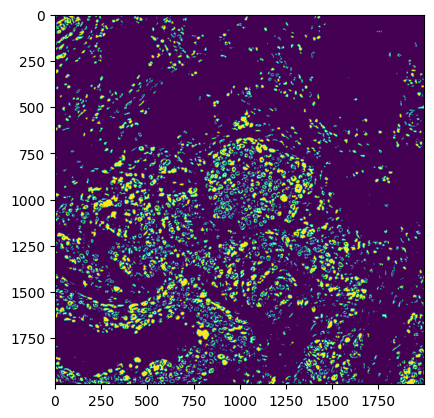

CD31 0.9468000000000001


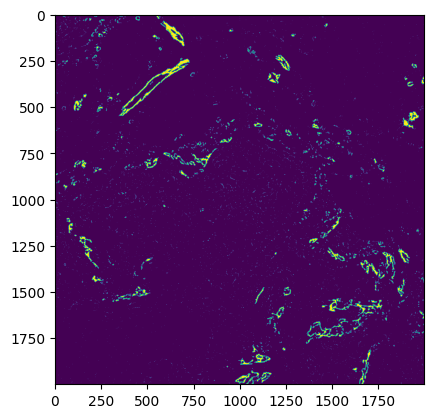

E-cadherin 4.9626


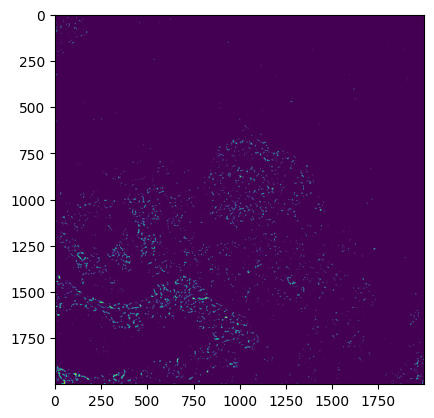

CD4 3.3474


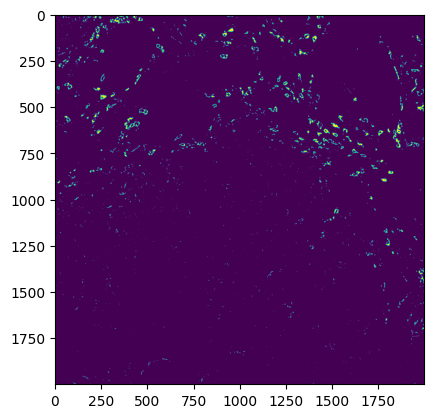

CD20 1.23


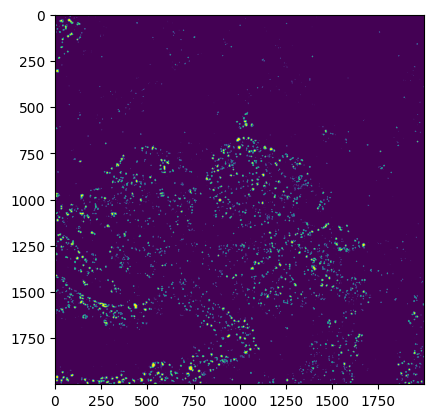

Ki67 3.4026


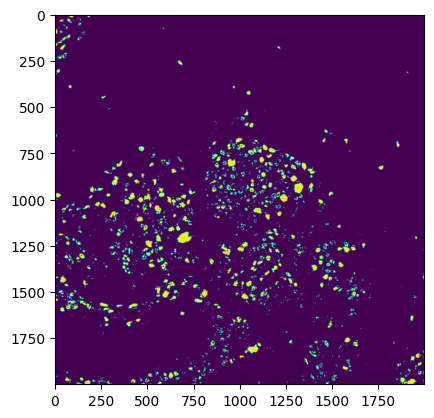

CD68 3.4938


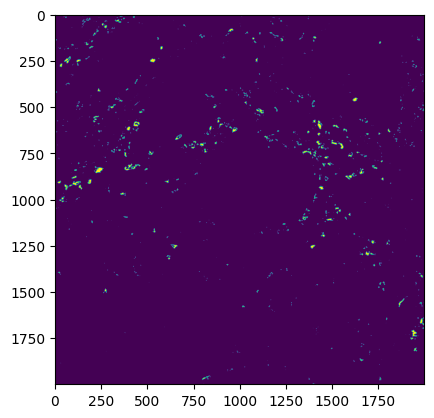

Pan-CK 0.9744


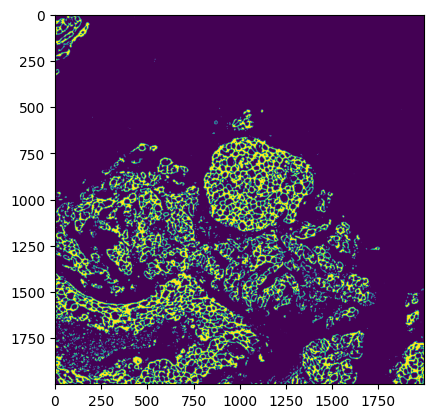

CD8 4.626


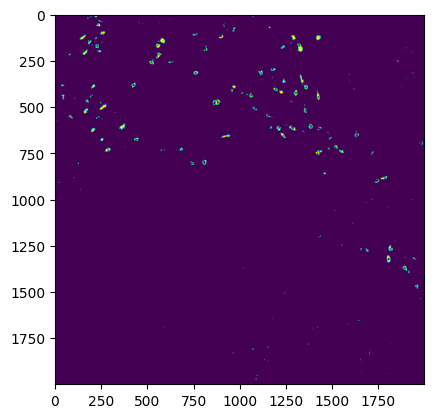

Histone H3 Pho 3.3072000000000004


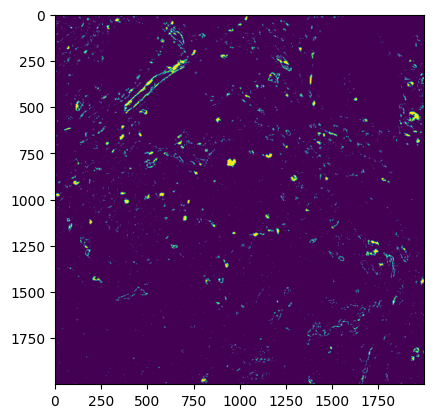

CD163 1.4034


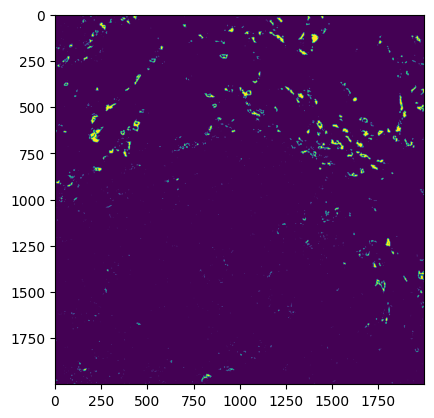

Podoplanin 5.0112000000000005


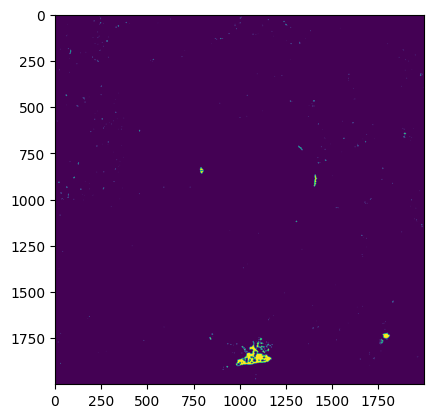

CD3e 2.637


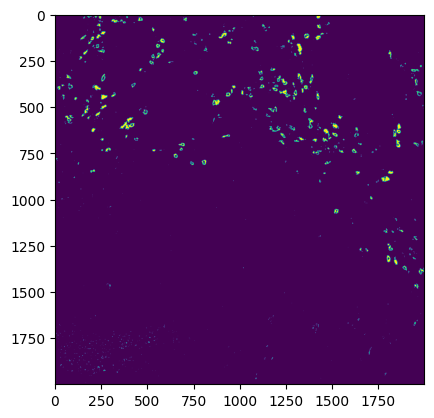

CD36 0.8556


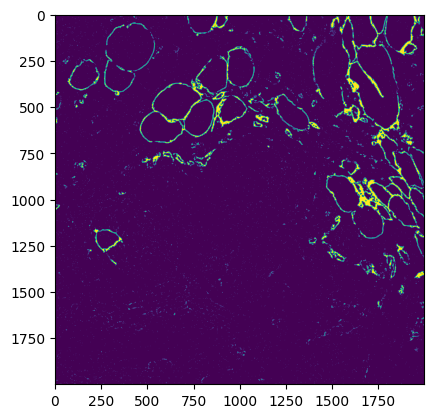

HIF1a 4.9344


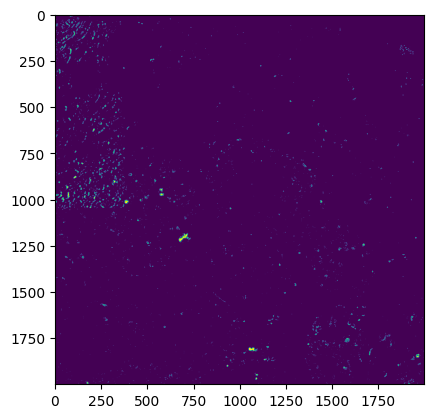

GLUT1 1.9368


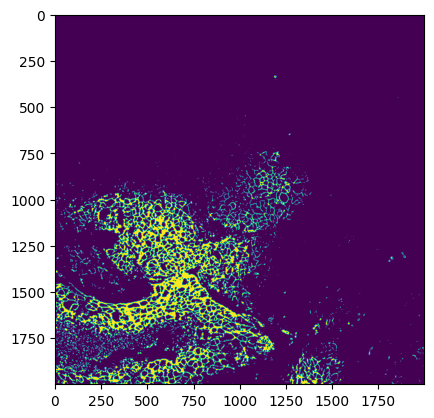

GATA3 0.32820000000000005


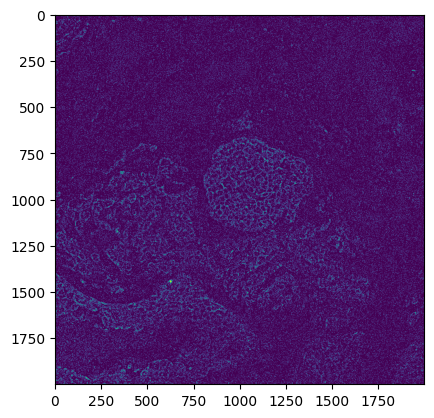

CD45RO 3.6486


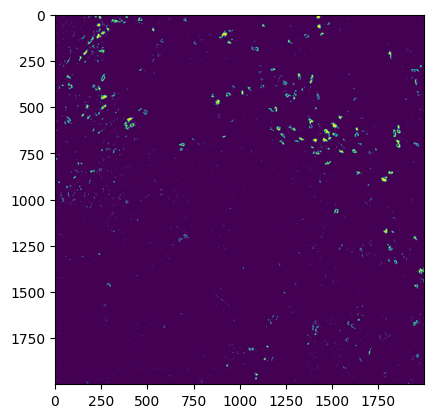

CD45RA 1.3026


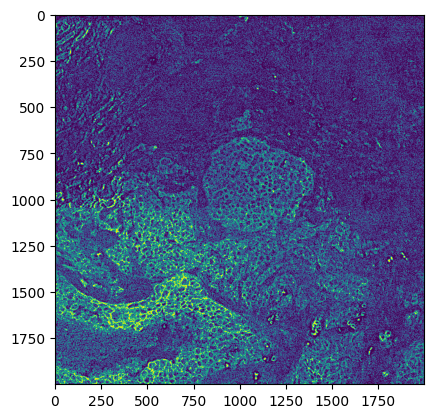

SMA 0.7776


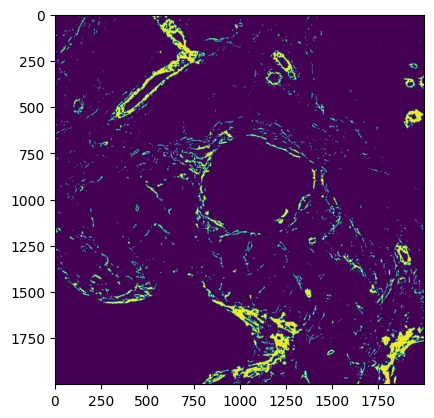

CK19 4.0314


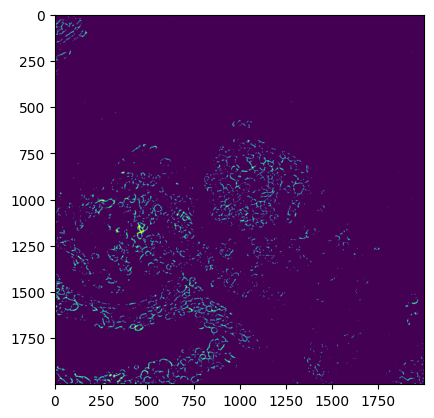

MGP 2.8104


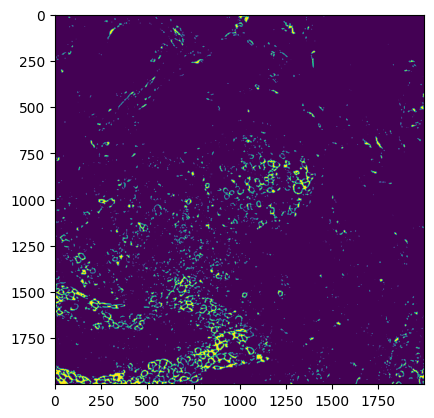

Vimentin 1.125


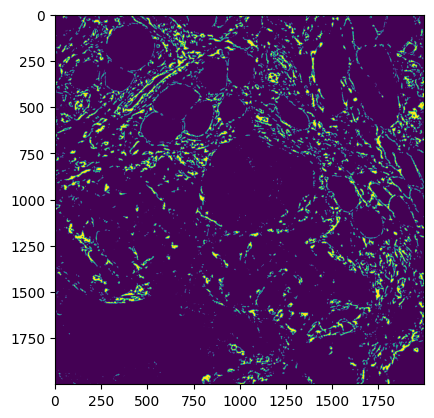

Maspin 2.9508


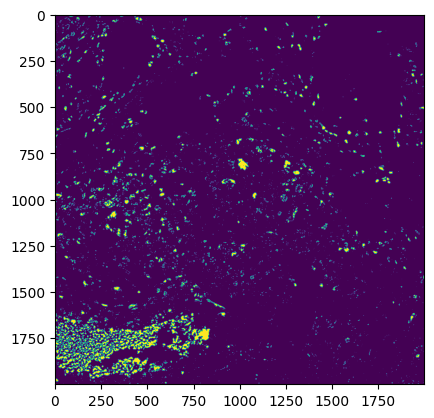

Foxp3 2.5434


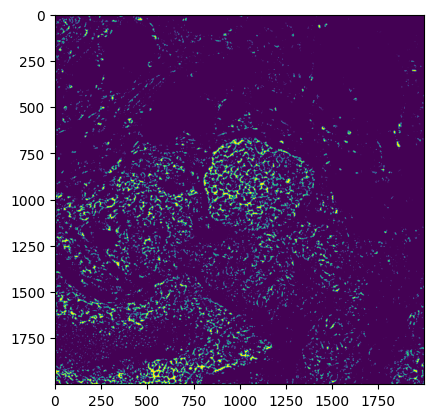

MMP9 3.777


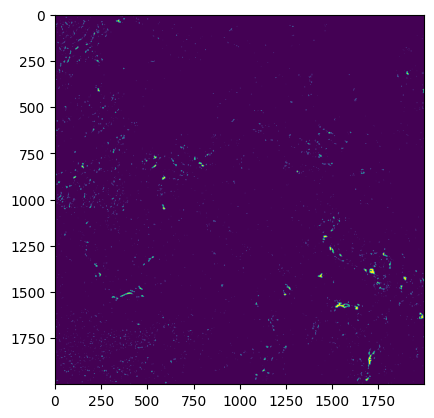

HLA-DR 1.9266


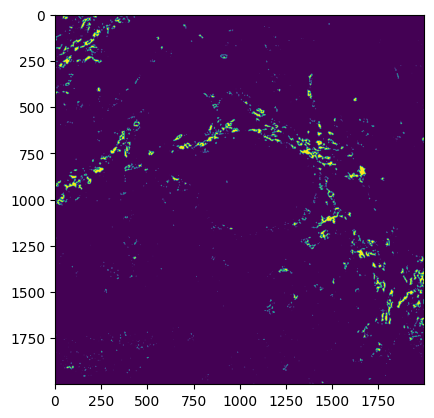

CK14 2.3382


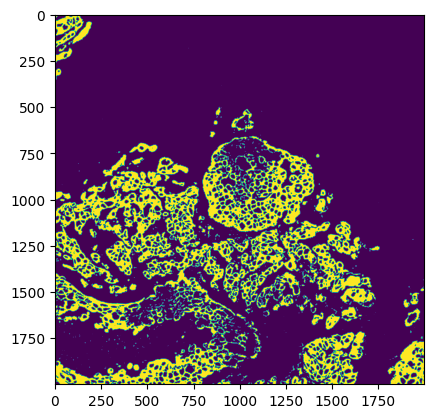

CD11c 2.9994


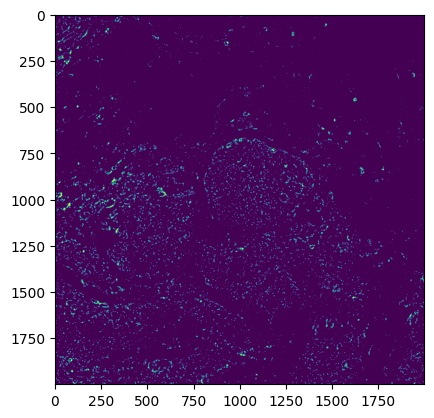

CD44 3.6432


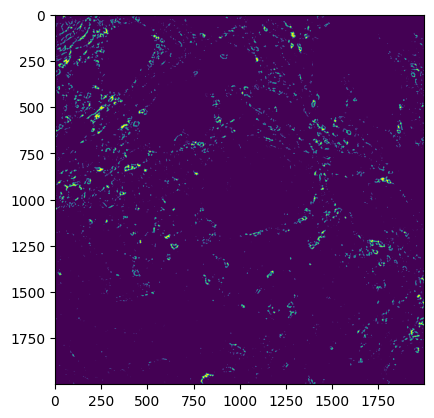

In [57]:
for c, img in channel_to_img.items():
    x = channel_to_img[c] / channel_to_img[c].std()
    rows, cols = np.random.choice(x.shape[0], size=10000), np.random.choice(x.shape[1], size=10000)
    vals = x[rows, cols]
#     vals = np.random.choice(x.flatten(), size=10000)
    nums, counts = np.unique(vals, return_counts=True)
    peak = counts[1:6].mean()
    thresh = peak * .003
    mask = x >= thresh
    print(c, thresh)
    plt.imshow(mask)
    plt.show()

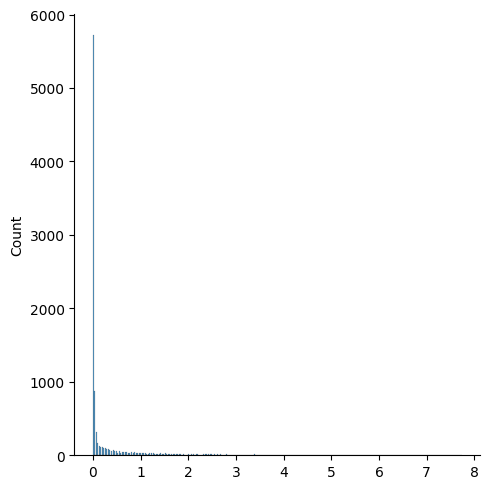

In [17]:
c = 'Pan-CK'
sns.displot(np.random.choice(
    (channel_to_img[c] / channel_to_img[c].std()).flatten(),
    size=10000))

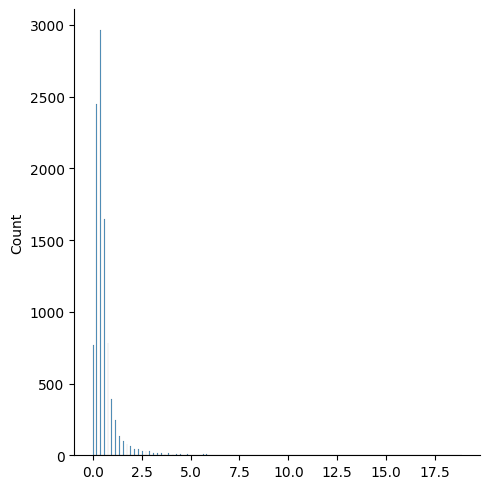

In [19]:
c = 'E-cadherin'
sns.displot(np.random.choice(
    (channel_to_img[c] / channel_to_img[c].std()).flatten(),
    size=10000))

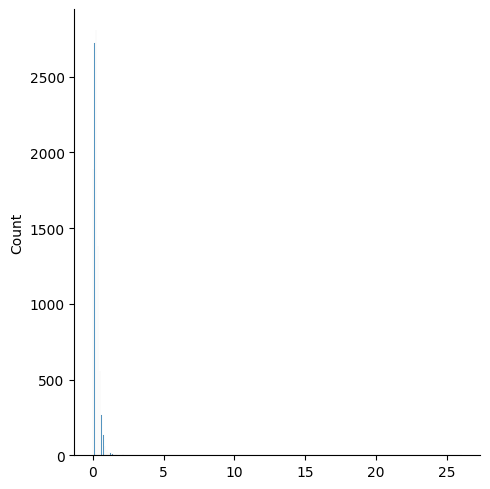

In [20]:
c = 'CD8'
sns.displot(np.random.choice(
    (channel_to_img[c] / channel_to_img[c].std()).flatten(),
    size=10000))

In [25]:
def get_pct_threshold(x, pct=.99, n=10000):
    idx = int(n * pct)
    vals = np.sort(np.random.choice(x.flatten(), size=n))
    return vals[idx]
    

DAPI 3.494028559041366


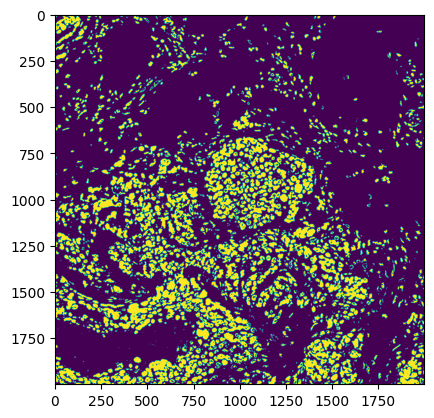

CD31 3.494028559041366


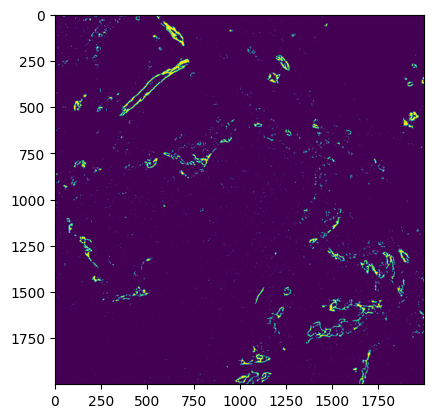

E-cadherin 3.494028559041366


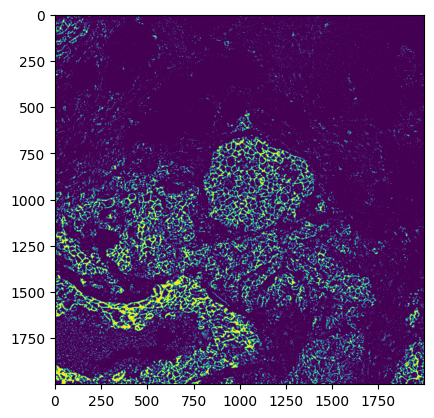

CD4 3.494028559041366


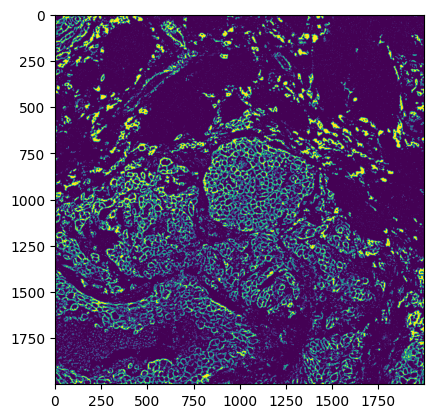

CD20 3.494028559041366


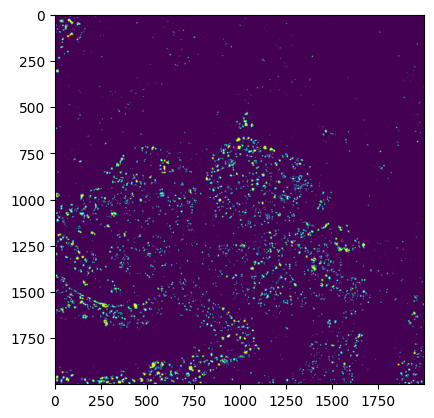

Ki67 3.494028559041366


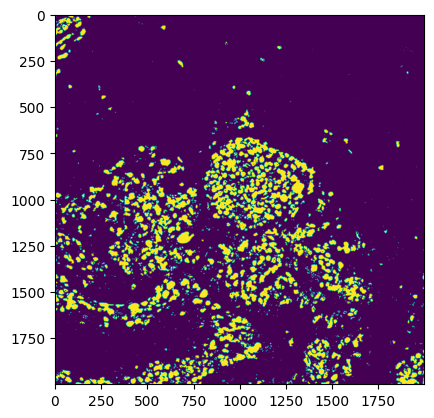

CD68 3.494028559041366


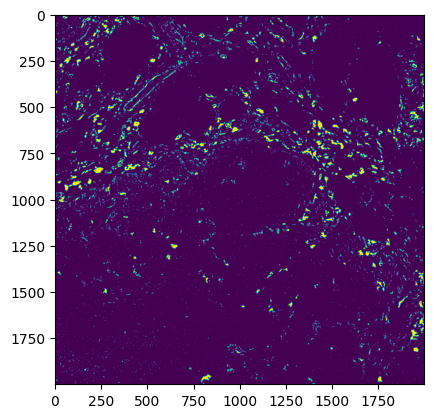

Pan-CK 3.494028559041366


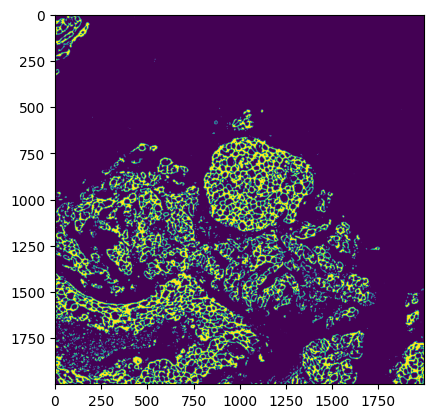

CD8 3.494028559041366


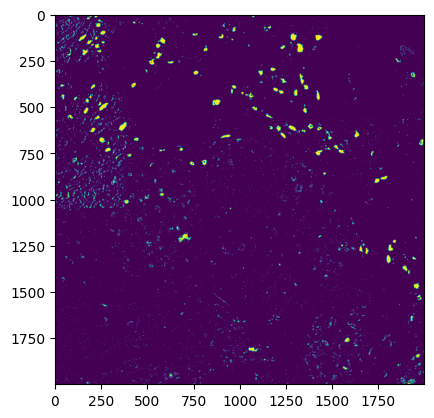

Histone H3 Pho 3.494028559041366


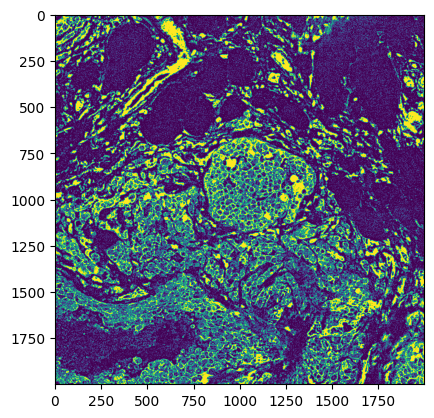

CD163 3.494028559041366


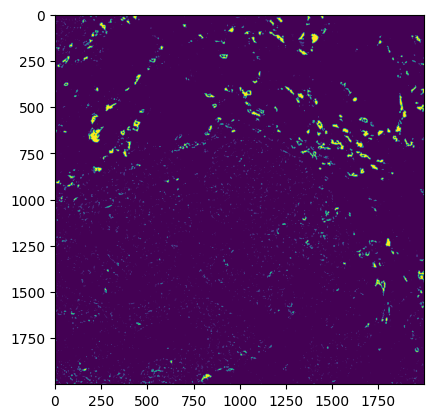

Podoplanin 3.494028559041366


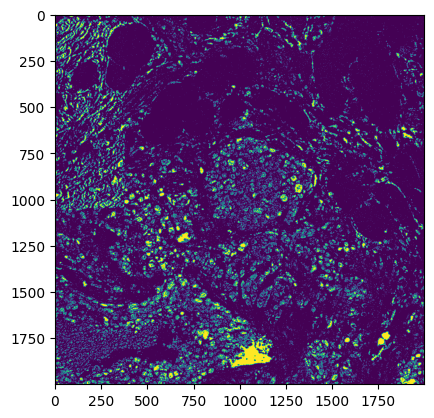

CD3e 3.494028559041366


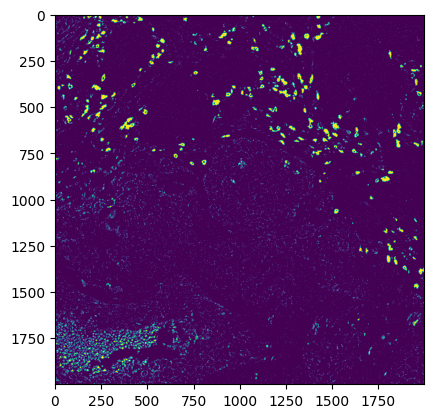

CD36 3.494028559041366


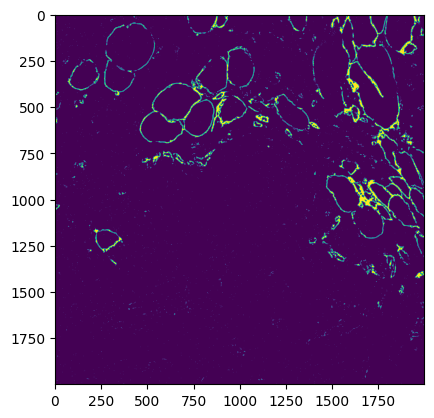

HIF1a 3.494028559041366


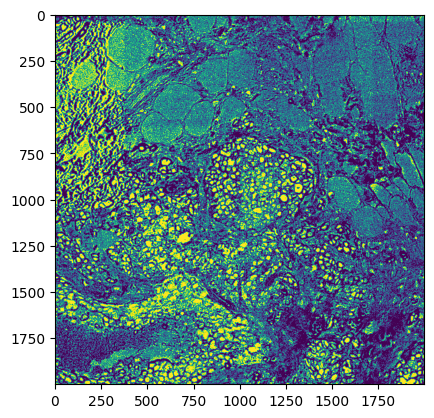

GLUT1 3.494028559041366


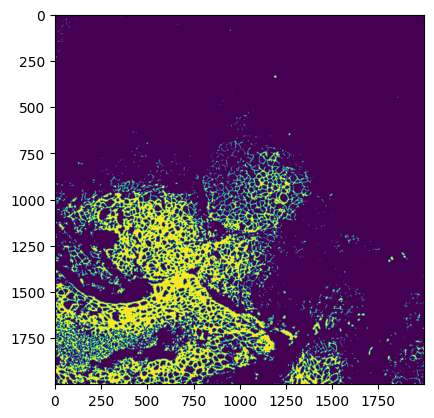

GATA3 3.494028559041366


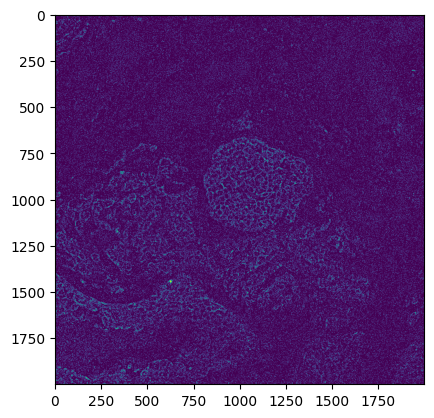

CD45RO 3.494028559041366


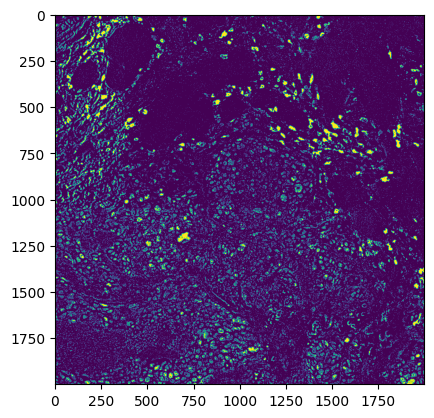

CD45RA 3.494028559041366


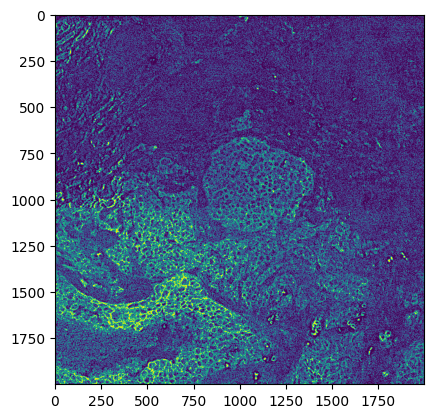

SMA 3.494028559041366


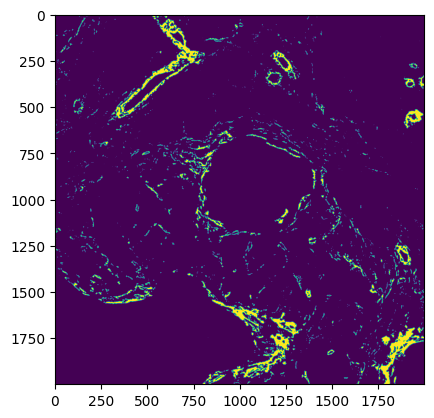

CK19 3.494028559041366


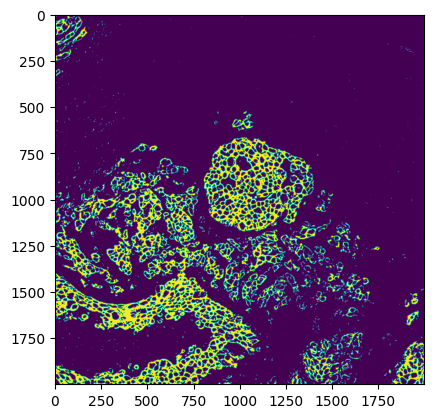

MGP 3.494028559041366


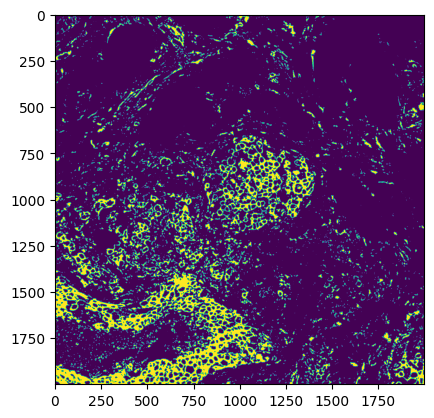

Vimentin 3.494028559041366


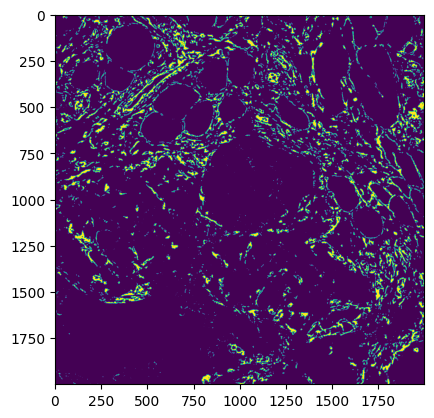

Maspin 3.494028559041366


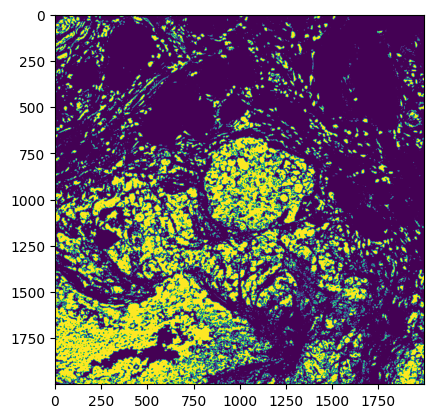

Foxp3 3.494028559041366


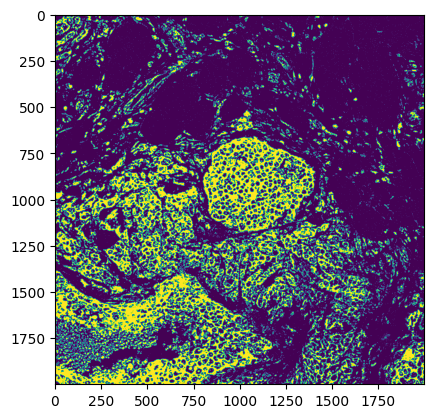

MMP9 3.494028559041366


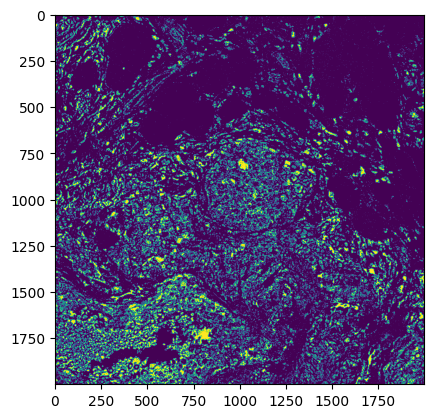

HLA-DR 3.494028559041366


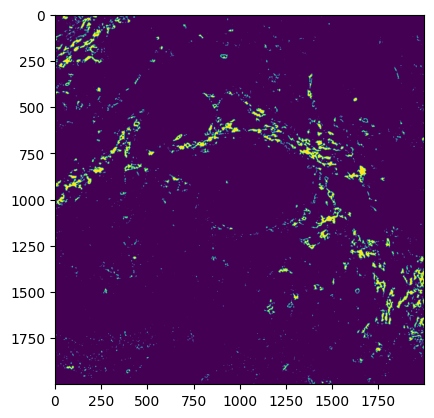

CK14 3.494028559041366


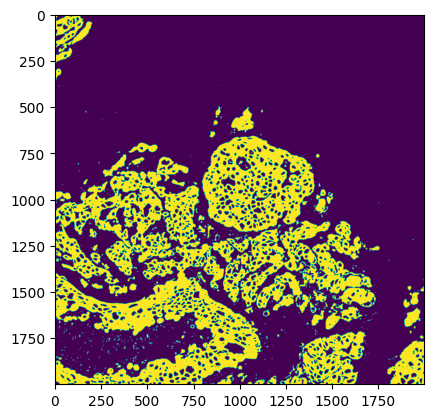

CD11c 3.494028559041366


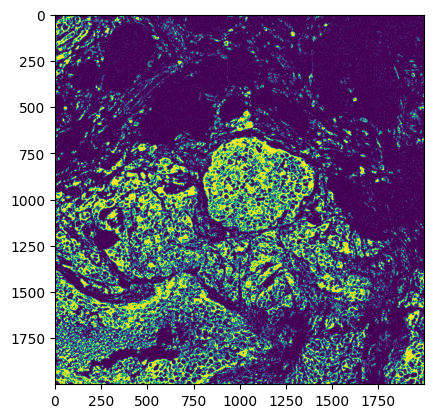

CD44 3.494028559041366


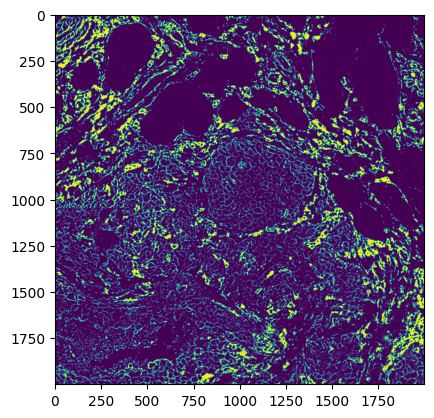

In [30]:
for c, img in channel_to_img.items():
    x = img / img.std()
#     thresh = get_pct_threshold(x, pct=.98)
    mask = x >= 1.
    print(c, thresh)
    plt.imshow(mask)
    plt.show()
    

In [26]:
get_pct_threshold(channel_to_img[c] / channel_to_img[c].std(), pct=.99, n=10000)

1.7609837479502366

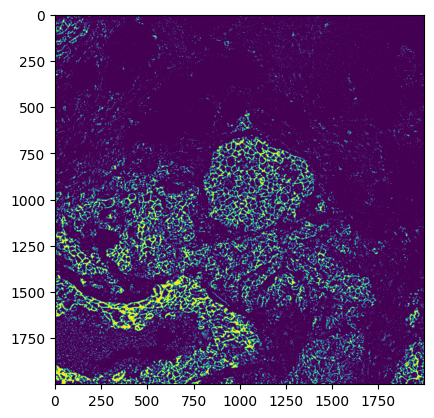

In [10]:
c = 'E-cadherin'
plt.imshow(channel_to_img[c] / channel_to_img[c].std() > 1.)

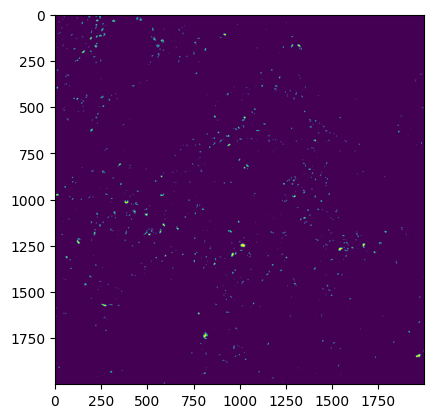

In [8]:
c = 'DAPI'
plt.imshow(channel_to_img[c] / channel_to_img[c].std() > 5.)

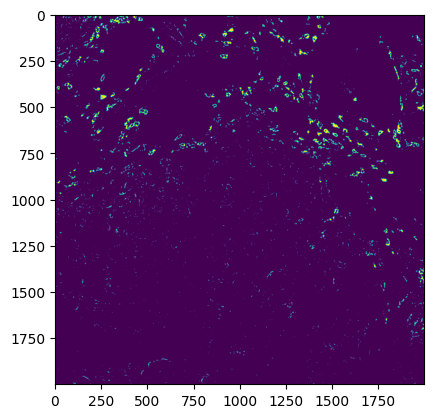

In [12]:
c = 'CD4'
plt.imshow(channel_to_img[c] / channel_to_img[c].std() > 3.)

In [19]:
img = tifffile.imread('/diskmnt/Projects/Users/estorrs/multiplex-imaging-pipeline/examples/test/output_region_mask.tif')
img

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 8, 8, 8],
       [0, 0, 0, ..., 8, 8, 8],
       [0, 0, 0, ..., 8, 8, 8]], dtype=int16)

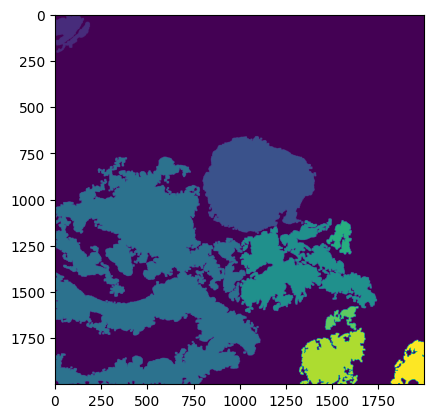

In [20]:
plt.imshow(img)

In [3]:
import tifffile

In [4]:
img = tifffile.imread(
    '/diskmnt/Projects/Users/estorrs/multiplex-imaging-pipeline/examples/test/output_cell_segmentation.tif')
img.shape

(2000, 2000)

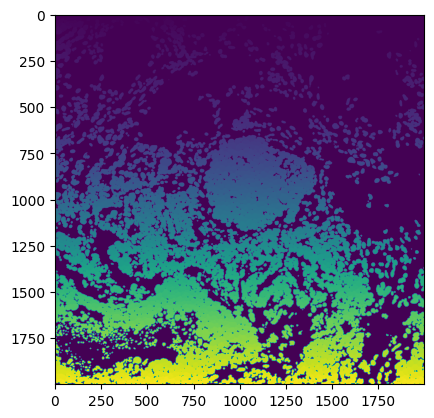

In [5]:
plt.imshow(img)

In [6]:
import scanpy as sc

In [7]:
a = sc.read_h5ad(
    '/diskmnt/Projects/Users/estorrs/multiplex-imaging-pipeline/examples/test/output_spatial_features.h5ad')
a

AnnData object with n_obs × n_vars = 4333 × 30
    obs: 'row', 'col', 'bbox-r1', 'bbox-c1', 'bbox-r2', 'bbox-c2', 'area', 'CD11c_intensity', 'CD163_intensity', 'CD20_intensity', 'CD31_intensity', 'CD36_intensity', 'CD3e_intensity', 'CD44_intensity', 'CD45RA_intensity', 'CD45_intensity', 'CD4_intensity', 'CD68_intensity', 'CD8_intensity', 'CK14_intensity', 'CK19_intensity', 'DAPI_intensity', 'E-cadherin_intensity', 'FOXP3_intensity', 'GATA3_intensity', 'GLUT1_intensity', 'HIF1a_intensity', 'HLA-DR_intensity', 'Histone H3 Pho_intensity', 'Ki67_intensity', 'MGP_intensity', 'MMP9_intensity', 'Maspin_intensity', 'Pan-Cytokeratin_intensity', 'Podoplanin_intensity', 'SMA_intensity', 'Vimentin_intensity', 'cell_type'
    uns: 'gating_strategy'
    obsm: 'spatial'

In [8]:
a.obsm['spatial']

array([[1.48240000e+02, 3.63333333e+00],
       [1.62970588e+02, 1.82352941e+00],
       [1.02396226e+02, 2.00000000e+00],
       ...,
       [6.69436782e+02, 1.99632184e+03],
       [1.35353448e+03, 1.99672414e+03],
       [1.82024359e+03, 1.99621795e+03]])

In [9]:
a.obs

,row,col,bbox-r1,bbox-c1,bbox-r2,bbox-c2,area,CD11c_intensity,CD163_intensity,CD20_intensity,...,Histone H3 Pho_intensity,Ki67_intensity,MGP_intensity,MMP9_intensity,Maspin_intensity,Pan-Cytokeratin_intensity,Podoplanin_intensity,SMA_intensity,Vimentin_intensity,cell_type
label,,,,,,,,,,,,,,,,,,,,,
1,3.633333,148.240000,0,138,10,160,150,2.633333,27.786667,0.240000,...,3.093333,1.546667,7.526667,5.446667,5.333333,0.380000,1.586667,0.700000,27.486667,Treg
2,1.823529,162.970588,0,160,5,168,34,0.323529,0.323529,0.000000,...,0.352941,0.294118,3.264706,1.500000,4.117647,0.205882,1.911765,0.000000,1.529412,CD4 T cell
3,2.000000,102.396226,0,96,6,108,53,0.735849,1.188679,0.000000,...,2.301887,0.113208,4.905660,2.245283,4.075472,1.754717,2.433962,0.528302,14.415094,Macrophage - M1
4,3.444444,475.388889,2,473,7,478,18,0.555556,0.000000,0.000000,...,0.888889,0.888889,11.388889,2.055556,11.666667,0.000000,2.888889,0.055556,33.277778,Unlabeled
5,3.177215,551.468354,0,545,9,557,79,1.759494,0.164557,0.278481,...,3.063291,1.291139,40.886076,2.291139,4.670886,0.101266,2.430380,0.949367,3.911392,Macrophage - M1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4329,1996.283951,1560.197531,1992,1554,2000,1568,81,6.419753,1.111111,0.246914,...,2.172840,21.530864,10.469136,3.296296,10.172840,58.419753,3.037037,0.716049,0.876543,Epithelial
4330,1995.263736,1624.560440,1991,1619,2000,1631,91,1.516484,0.076923,0.175824,...,0.362637,2.516484,42.846154,4.131868,3.780220,0.769231,2.164835,2.252747,3.395604,Unlabeled
4331,1996.321839,669.436782,1993,662,2000,677,87,2.471264,0.839080,0.103448,...,1.517241,31.114943,21.908046,4.770115,11.068966,29.931034,3.839080,0.080460,0.137931,Epithelial


In [10]:
import seaborn as sns

In [11]:
cmap = sns.color_palette('tab20')
cmap

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)]

In [33]:
cmap[0] + (0.,)

(0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 0.0)

In [12]:
from skimage.segmentation import find_boundaries
import seaborn as sns
from matplotlib.lines import Line2D
from matplotlib.patches import Patch


In [13]:
def color_regions(labeled, label_to_annotation, label_to_bbox, mapping):
    rgba = np.zeros((labeled.shape[0], labeled.shape[1], 4))
    for label, annot in label_to_annotation.items():
        color = mapping[annot]
        r1, r2, c1, c2 = label_to_bbox[label]
        
        rgba[r1:r2, c1:c2][labeled[r1:r2, c1:c2]==label] = color
        
        bounds = find_boundaries(labeled[r1:r2, c1:c2]==label, mode='thick')
        
        rgba[r1:r2, c1:c2][bounds] = [.85, .85, .85, 1.]
    
    return rgba

In [14]:
label_to_annotation = {int(l):annot for l, annot in zip(a.obs.index, a.obs['cell_type'])}
label_to_bbox = {int(l):(r1, r2, c1, c2) for l, r1, r2, c1, c2 in zip(
    a.obs.index, a.obs['bbox-r1'], a.obs['bbox-r2'], a.obs['bbox-c1'], a.obs['bbox-c2'])}
mapping = {annot:c + (1.,)
           for annot, c in zip(sorted(set(label_to_annotation.values())), sns.color_palette('tab20'))}

rgba = color_regions(img, label_to_annotation, label_to_bbox, mapping)

In [15]:
mosaic = [
    ['a', 'a', 'a', 'a', 'b'],
    ['a', 'a', 'a', 'a', 'b'],
    ['a', 'a', 'a', 'a', 'b'],
    ['a', 'a', 'a', 'a', 'b'],
]
fig, axs = plt.subplot_mosaic(mosaic, layout='constrained', figsize=(10, 10))
for name, ax in axs.items():
    ax.axis('off')

ax = axs['a']
ax.imshow(rgba)

ax = axs['b']

custom = [Line2D([0], [0], marker='s', color='gray', label=label,
                 markerfacecolor=color, markersize=10, linestyle='')
         for label, color in mapping.items()]
ax.legend(handles=custom, loc='center')

In [60]:
from matplotlib.lines import Line2D
from matplotlib.patches import Patch


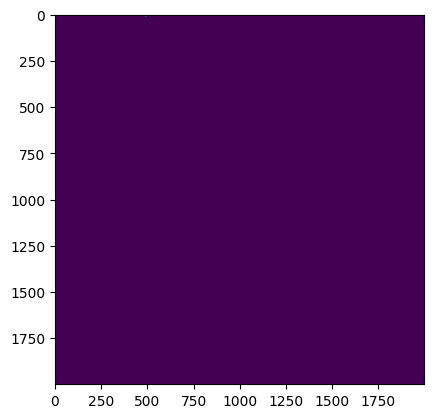

In [45]:
plt.imshow(img==10)

In [48]:
r1, r2, c1, c2 = label_to_bbox[1]

KeyError: 1

In [49]:
label_to_bbox['1']

(0, 10, 138, 160)